<a href="https://colab.research.google.com/github/jfuentesg26/ProcImg2022-1/blob/main/ProyectoFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Entrega final: VAR automático**

## Procesamiento de imágenes

### Javiera Fuentes

## **Cargado de imágenes**


In [107]:
from google.colab import drive
 
drive.mount('/content/drive')  

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [108]:
%cd drive/MyDrive/ImagenesT2

[Errno 2] No such file or directory: 'drive/MyDrive/ImagenesT2'
/content/drive/MyDrive/ImagenesT2


In [109]:
import cv2
from google.colab.patches import cv2_imshow

img1 = cv2.imread('Off side 1.png')
img2 = cv2.imread('Off side 2.png')
img3 = cv2.imread('Off side 3.png')
img4 = cv2.imread('Off side 4.jpg')
img5 = cv2.imread('Off side 5.jpg')

In [110]:
img1_gray = cv2.imread('Off side 1.png', 0)
img2_gray = cv2.imread('Off side 2.png', 0)
img3_gray = cv2.imread('Off side 3.png', 0)
img4_gray = cv2.imread('off side 4.jpg',0 )
img5_gray = cv2.imread('off side 5.jpg',0 )

## **Obtener lineas**

### **Segmentar pasto**

Esto provoca que las lineas se detecten más facilmente con Canny

#### Ajuste de parámetros

In [111]:
from ipywidgets import interact

def green_segmentation(i =0, l_h=30, h_h=70, l_s=40, h_s=255, l_v=40, h_v=160):
  imgs = [img1, img2, img3, img4, img5]
  tohsv = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (l_h, l_s, l_v), (h_h, h_s, h_v))
  # negado = cv2.bitwise_not(mask)
  result = cv2.bitwise_and(imgs[i], imgs[i], mask=mask)
  cv2_imshow(result)

interact(green_segmentation, i=(0,5,1), l_h=(0,255,1), h_h=(0,255,1), l_s=(0,255,1), h_s=(0,255,1), l_v=(0,255,1), h_v=(0,255,1))

interactive(children=(IntSlider(value=0, description='i', max=5), IntSlider(value=30, description='l_h', max=2…

<function __main__.green_segmentation>

#### Aplicacion

In [112]:
def green_segmentation(lista, l_h=30, h_h=70, l_s=40, h_s=255, l_v=40, h_v=170):
  imgs = [img1, img2, img3, img4, img5]
  for image in imgs:
    tohsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(tohsv, (l_h, l_s, l_v), (h_h, h_s, h_v))
    # negado = cv2.bitwise_not(mask)
    result = cv2.bitwise_and(image, image, mask=mask)
    lista.append(result)
  return lista

green_seg_imgs = green_segmentation([])


### **Canny + Hough**

#### Suavizado inicial y cambio a escala de grises

In [113]:
def blurimg(images, kernel):
  blur_images = []
  for img in images:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    res = cv2.blur(gray, kernel)
    blur_images.append(gray)
  return blur_images

# blur_imgs = blurimg(white_seg_imgs, (3,3))
# gray = [img1_gray, img2_gray, img3_gray, img4_gray, img5_gray, img6_gray]
# images = [img1, img2, img3, img4, img5, img6]
blur_imgs = blurimg(green_seg_imgs, (5,5))

#### Ajuste de parámetros Canny

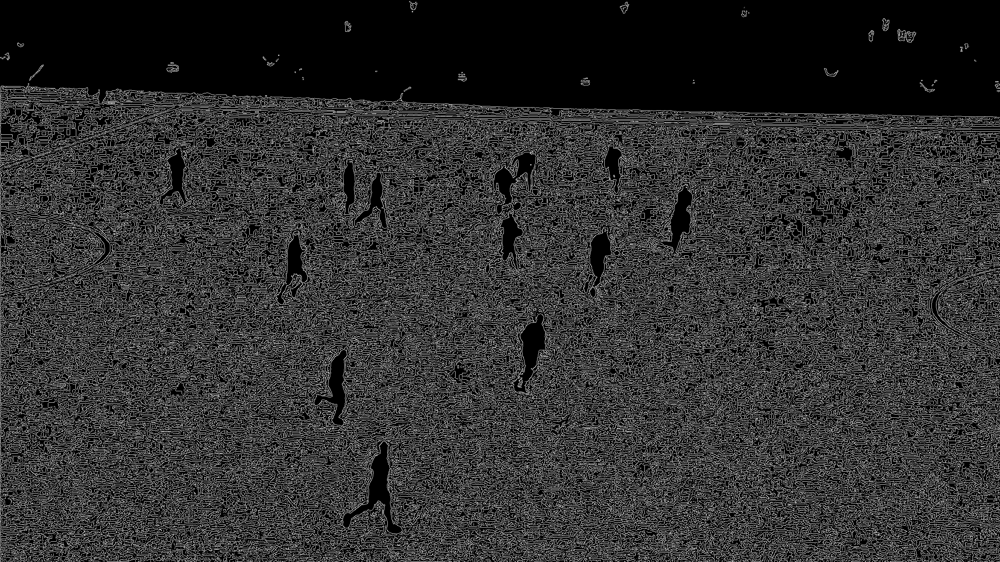

<function __main__.canny_function>

In [ ]:
from ipywidgets import interact

def canny_function(i=0, lower=0, upper=0):
  detected_edges = cv2.Canny(blur_imgs[i].copy(), lower, upper)
  print(lower, upper)
  # result = imgsog[i] * (mask[:,:,None].astype(imgsog[i].dtype))
  cv2_imshow(detected_edges)

interact(canny_function,
         lower=(0,100, 2), upper=(0,255,2), i=(0, 5, 1))

#### Aplicacion Canny

In [114]:
def canny_function(lower=40, upper=164):
  edges = []
  for img in blur_imgs:
    detected_edges = cv2.Canny(img, lower, upper)
    edges.append(detected_edges)
  return edges

edges_imgs = canny_function()

#### Ajuste de parámetros Hough

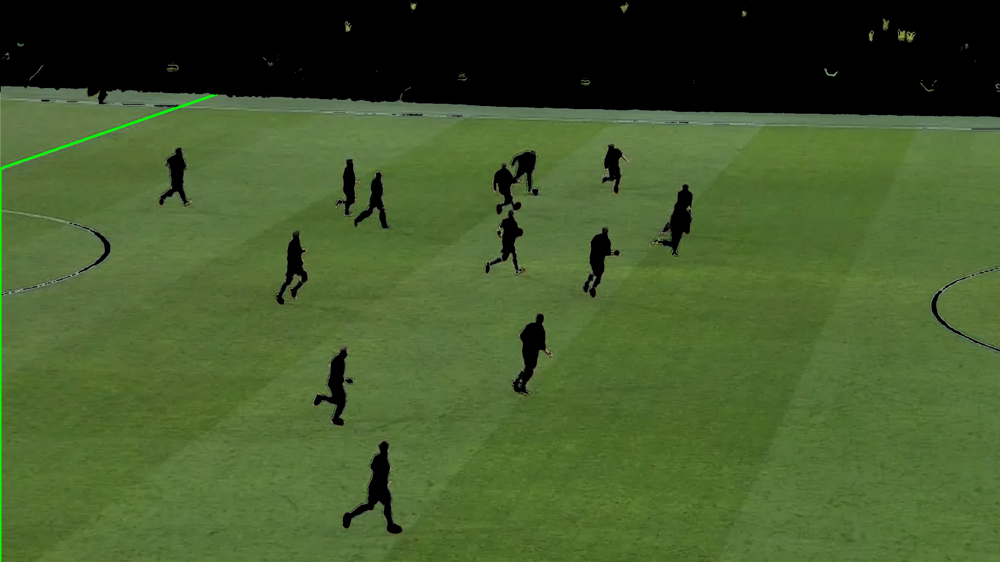

<function __main__.hough_lines_param>

In [ ]:
import numpy as np

def hough_lines_param(i=0, min=10, max=100):
  copy = green_seg_imgs[i].copy()
  lines = cv2.HoughLinesP(edges_imgs[i], 1, np.pi/180, 100, minLineLength=min, maxLineGap=max)
  # Iterate over points
  lines_list = []
  ms = []
  for points in lines:
      # Extracted points nested in the list
      x1,y1,x2,y2=points[0]
      m = (y2 - y1)/(x2 - x1)
      if m > 0.34 or m < -0.34:
        # Draw the lines joing the points
        # On the original image
        cv2.line(copy,(x1,y1),(x2,y2),(0, 255, 0),2)
        # Maintain a simples lookup list for points
        lines_list.append([(x1,y1),(x2,y2)])

  cv2_imshow(copy)

interact(hough_lines_param, i=(0,4,1), min=(10, 200, 5), max=(50, 350, 10))

#### Aplicacion Hough

In [115]:
import numpy as np

def hough_lines(img, img_og, min, max):
  lines = cv2.HoughLinesP(img, 1, np.pi/180, 100, minLineLength=min, maxLineGap=max)
  # Iterate over points
  lines_list = []
  for points in lines:
      # Extracted points nested in the list
      x1,y1,x2,y2=points[0]
      m = (y2 - y1)/(x2 - x1)
      if m > 0.34 or m < -0.34:
        lines_list.append([(x1,y1),(x2,y2)])
  return lines_list

resultant_lines = []
for i in range (0, len(green_seg_imgs)):
  resultant_lines.append(hough_lines(edges_imgs[i], green_seg_imgs[i], 10, 100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in int_scalars
  # Remove the CWD from sys.path while we load stuff.


## **Elección de línea**

### Visualizar lineas de imagen especifica

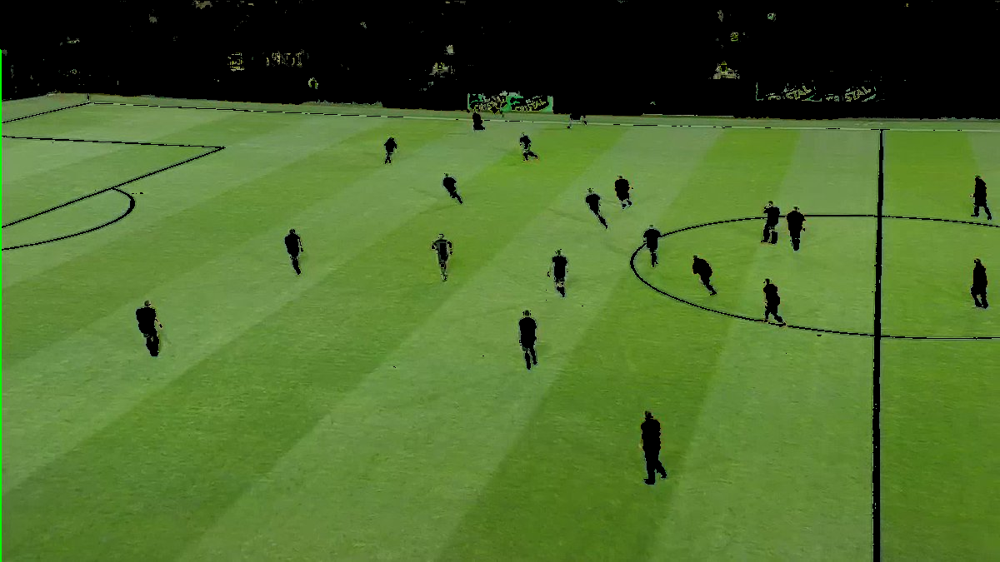

<function __main__.choose_line>

In [ ]:
# definir de que imagen queremos seleccionar
i_img = 4

def choose_line(i_img=4, i_line=0):
  linea = resultant_lines[i_img][i_line]
  copy = green_seg_imgs[i_img].copy()
  x1, y1 = linea[0]
  x2, y2 = linea[1]
  cv2.line(copy,(x1,y1),(x2,y2),(0, 255, 0),2)
  print("Mostrando linea numero", i_line)
  cv2_imshow(copy)


interact(choose_line, i_line=(0,len(resultant_lines[i_img]) - 1,1))

### **AQUI PONER LINEA ESCOGIDA**

In [116]:
indices_lineas = [2, 18, 2, 2, 4]

## **Segmentación de jugadores**

### **A continuación replicamos el procedimiento utilizado en la T4**

### Eliminacion de cesped

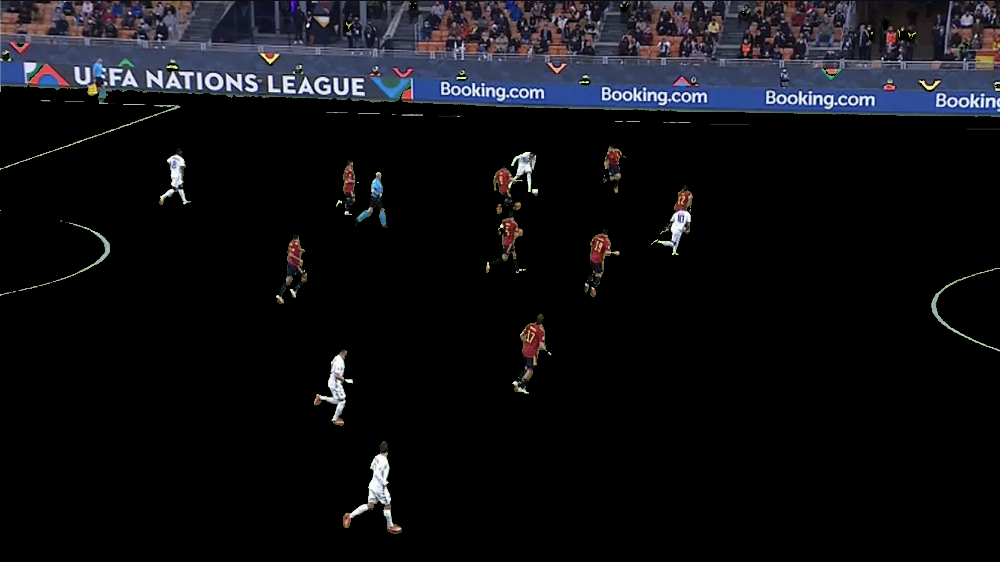

<function __main__.green_segmentation>

In [ ]:
from ipywidgets import interact

def green_segmentation(i =0, l_h=30, h_h=70, l_s=40, h_s=255, l_v=40, h_v=160):
  imgs = [img1, img2, img3, img4, img5]
  tohsv = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, (l_h, l_s, l_v), (h_h, h_s, h_v))
  negado = cv2.bitwise_not(mask)
  result = cv2.bitwise_and(imgs[i], imgs[i], mask=negado)
  cv2_imshow(result)

interact(green_segmentation, i=(0,4,1), l_h=(0,255,1), h_h=(0,255,1), l_s=(0,255,1), h_s=(0,255,1), l_v=(0,255,1), h_v=(0,255,1))

In [117]:
imgs = [img1, img2, img3, img4, img5]
def green_filter(img, bajo, alto):
  tohsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  mask = cv2.inRange(tohsv, bajo, alto)
  negado = cv2.bitwise_not(mask)
  result = cv2.bitwise_and(img, img, mask=negado)
  return result

bajo = (30,73,40)
alto = (70,220, 162)

wgreen = []
for img in imgs:
  wgreen.append(green_filter(img, bajo, alto))


### Preparar para canny

In [118]:
def prepare(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  dst = cv2.medianBlur(gray, 5)
  return dst

pfor_canny = []
for img in wgreen:
  pfor_canny.append(prepare(img))

### Aplicar canny

#### Ajuste de parametros

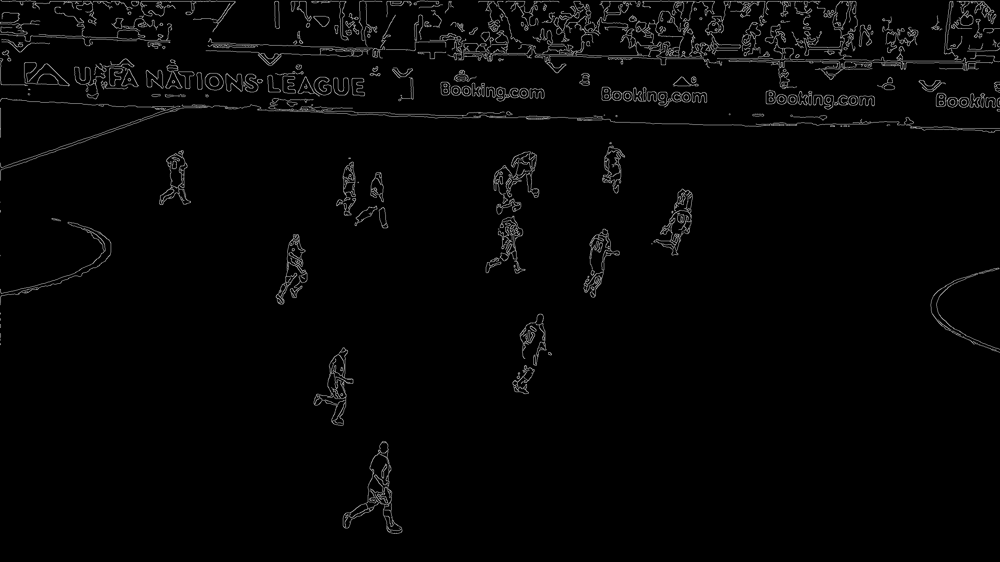

<function __main__.canny_function>

In [ ]:
def canny_function(lower=0, upper=255, i=0):
  result = cv2.Canny(pfor_canny[i], lower, upper)
  cv2_imshow(result)

interact(canny_function, 
         i = (0,4,1),
         lower=(0,255, 5),
         upper=(0, 255, 5))

#### Aplicacion

In [119]:
def make_canny(lower, upper, imgs):
  res = []
  for img in imgs:
    c = cv2.Canny(img, lower, upper)
    kernel = np.ones((9,9), np.uint8)
    dil1 = cv2.dilate(c, kernel)
    #c = cv2.morphologyEx(c, cv2.MORPH_CLOSE, (5,5))
    res.append(dil1)
  return res
wcanny = make_canny(40, 150, pfor_canny)

### Encontrar y filtrar contornos

In [120]:
def get_init_contours():
  c = []
  for i in range(len(wcanny)):
    contours1, hierarchy1 = cv2.findContours(wcanny[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    c.append(contours1)
  return c

contours = get_init_contours()

#### Mostrar contornos y filtrar los más pequeños

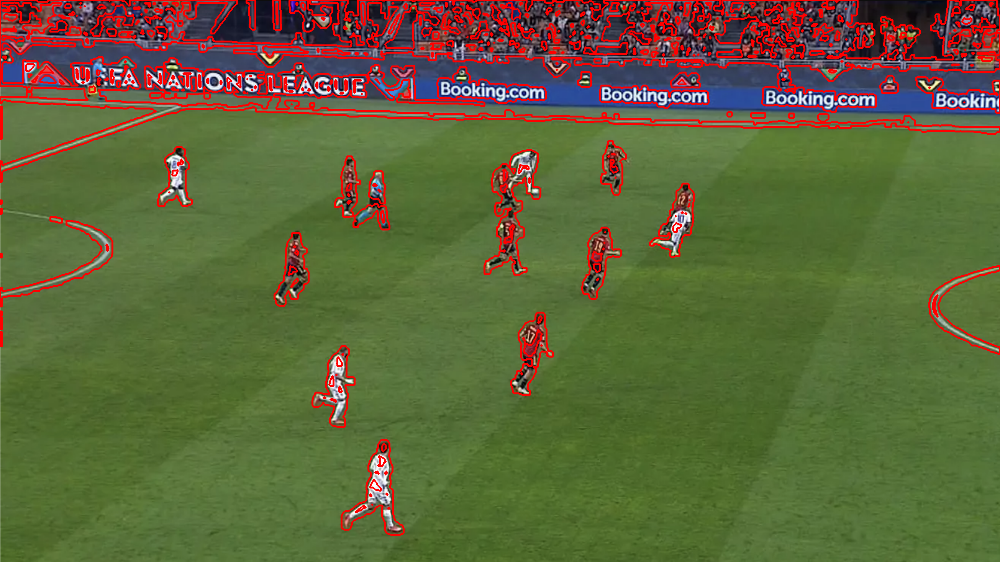

<function __main__.show_contours>

In [ ]:
def show_contours(i=0):
    imgs = [img1, img2, img3, img4, img5]
    copia = imgs[i].copy()
    cv2.drawContours(copia, contours[i], -1, (0, 0, 2555), 3)
    cv2_imshow(copia)

interact(show_contours, i=(0,4,1))

In [121]:
def filter_c (number=100, number_max=10500, i=0):
  imgs = [img1, img2, img3, img4, img5]
  new_contours = []
  for co in contours[i]:
    calc = cv2.contourArea(co)
    if calc > number and calc < number_max:
      new_contours.append(co)
    if calc > number_max:
      print(calc)
  copia = imgs[i].copy()
  cv2.drawContours(copia, new_contours, -1, (0,255,0), 3)
  print(number, number_max)
  cv2_imshow(copia)

interact(filter_c, number=(100, 20000, 100), number_max=(1000, 200000, 1000), i=(0,4,1))

interactive(children=(IntSlider(value=100, description='number', max=20000, min=100, step=100), IntSlider(valu…

<function __main__.filter_c>

In [122]:
def get_new_contours(contours):
  new_contours1 = []
  for c in contours:
    calc = cv2.contourArea(c)
    if calc > 600 and calc < 89000:
      new_contours1.append(c)
  return new_contours1

new_contours = []
for c in contours:
  new_contours.append(get_new_contours(c))

#### Bounding boxes

In [124]:
# white
lower_white = np.array([0,0,200])
upper_white = np.array([105,60,255])

def bboxes(i=4):
  final_contours = []
  bounding_boxes = []
  imgs = [img1, img2, img3, img4, img5]
  copia_b = imgs[i].copy()
  nc = new_contours
  for c in nc[i]:
    calc = cv2.contourArea(c)
    x,y,w,h = cv2.boundingRect(c)
    if  (((200 < h < 300 and 200 < w < 300) or (h > w and h > 30)) and w*h*0.2 < calc and y > 150 and x > 150):
      player = copia_b[y:y+h,x:x+w]
      player_hsv = cv2.cvtColor(player, cv2.COLOR_BGR2HSV)
      maskwhite = cv2.inRange(player_hsv, lower_white, upper_white)
      CountWhite = cv2.countNonZero(maskwhite)
      mask1 = cv2.inRange(player_hsv, (0, 70, 50), (10, 255, 255))
      mask2 = cv2.inRange(player_hsv, (170, 70, 50), (180, 255, 255))
      maskRed = mask1 | mask2;
      CountredRed = cv2.countNonZero(maskRed)
      if (CountredRed >= 40 or CountWhite >= 40):
        final_contours.append(c)
        bounding_boxes.append([x,y,w,h])
        cv2.rectangle(copia_b,(x,y),(x+w,y+h),(255,0,255),3)
  cv2_imshow(copia_b)

interact(bboxes, i=(0,4,1))

interactive(children=(IntSlider(value=4, description='i', max=4), Output()), _dom_classes=('widget-interact',)…

<function __main__.bboxes>

In [134]:
def contains(rect, rect2):
  x1,y1,w1,h1 = rect
  x2,y2,w2,h2 = rect2
  return x1 < x2 < x2 + w2 < x1 + w1 and y1 < y2 < y2 + h2 < y1 + h1

def bigger_boxes(bboxes, contours):
  result = []
  result_c = []
  for i in range(len(bboxes)):
    append = True
    for rect2 in bboxes:
      if contains(rect2, bboxes[i]):
        append = False
    if append:
      result.append(bboxes[i])
      result_c.append(contours[i])
  return (result, result_c)

def final_contours(nc, copia2):
  final_contours = []
  bboxes = []
  for c in nc:
    x,y,w,h = cv2.boundingRect(c)
    calc = cv2.contourArea(c)
    x,y,w,h = cv2.boundingRect(c)
    if  (((200 < h < 300 and 200 < w < 300) or (h > w and h > 30)) and w*h*0.2 < calc and y > 150 and x > 150):
      player = copia2[y:y+h,x:x+w]
      player_hsv = cv2.cvtColor(player, cv2.COLOR_BGR2HSV)
      maskwhite = cv2.inRange(player_hsv, lower_white, upper_white)
      CountWhite = cv2.countNonZero(maskwhite)
      mask1 = cv2.inRange(player_hsv, (0, 70, 50), (10, 255, 255))
      mask2 = cv2.inRange(player_hsv, (170, 70, 50), (180, 255, 255))
      maskRed = mask1 | mask2;
      CountredRed = cv2.countNonZero(maskRed)
      if (CountredRed >= 40 or CountWhite >= 40):
        final_contours.append(c)
        bboxes.append([x,y,w,h])
  return (final_contours, bboxes)

final_bounding_boxes = []
f_contours = []
for i in range(len(new_contours)):
  res_cont, res_boxes = final_contours(new_contours[i], imgs[i])
  res_boxes, res_cont = bigger_boxes(res_boxes, res_cont)
  final_bounding_boxes.append(res_boxes)
  f_contours.append(res_cont)


In [135]:
def see_boxes(i=4):
  imgs = [img1, img2, img3, img4, img5]
  copia2 = imgs[i].copy()
  for c in final_bounding_boxes[i]:
    x,y,w,h = c
    cv2.rectangle(copia2,(x,y),(x+w,y+h),(0,255, 0),3)
  cv2_imshow(copia2)

interact(see_boxes, i=(0,4,1))

interactive(children=(IntSlider(value=4, description='i', max=4), Output()), _dom_classes=('widget-interact',)…

<function __main__.see_boxes>

## **Obtener Jugador más cercano**

#### **Con el i_img y el i_line escogidos anteriormente calculamos la ecuacion de la recta y la distancia a cada bounding box**

In [ ]:
# primero calculamos el factor de profundidad, los jugadores que esten más cerca se veran mas grandes 
# y por tanto más cerca de la linea de lo que en vdd estan
# tomamos todos los bounding boxes, ordenamos las alturas de menor a mayor y obtenemos los dos valores centrales
# con esto hacemos un escalar que relaciona y con h. Para aplicarlo en futuras ocasiones.
def get_scalar(boundingboxes):
  values = []
  for box in boundingboxes:
    x,y,w,h = box
    values.append((y, h))
  values.sort(key = lambda x: x[1])
  middle = len(values) // 2
  y1, h1 = values[middle]
  y2, h2 = values[middle + 1]
  escalar = abs((h2 - h1)/ (y2 - y1))
  return escalar

In [136]:
def get_distance(point, m, b):
  num = abs(-m*point[0] + point[1] - b)
  den = np.sqrt(m**2 + 1)
  return num/den

In [137]:
def get_nearest_box(indice_imagen, indice_linea, bounding_boxes):
  linea = resultant_lines[indice_imagen][indice_linea]
  x1, y1 = linea[0]
  x2, y2 = linea[1]
  m = (y2 - y1) / (x2 - x1)
  b = y1 - m*x1
  min_distance = 100000000000000000000000000000
  point = True
  actual_box = True
  actual_contour = True
  for i in range(len(bounding_boxes[indice_imagen])):
    box = bounding_boxes[indice_imagen][i]
    contour = f_contours[indice_imagen][i]
    x,y,w,h = box
    # PRIMERA ESQUINA
    p1 = (x, y)
    dist = get_distance(p1, m, b)
    if dist < min_distance:
      min_distance = dist
      point = p1
      actual_box = box
      actual_contour = contour
    # SEGUNDA ESQUINA
    p2 = (x + w, y)
    dist = get_distance(p2, m, b)
    if dist < min_distance:
      min_distance = dist
      point = p2
      actual_box = box
      actual_contour = contour
    # TERCERA ESQUINA
    p3 = (x + w, y + h)
    dist = get_distance(p3, m, b)
    if dist < min_distance:
      min_distance = dist
      point = p3
      actual_box = box
      actual_contour = contour
    # CUARTA ESQUINA
    p4 = (x, y + h)
    dist = get_distance(p4, m, b)
    if dist < min_distance:
      min_distance = dist
      point = p4
      actual_box = box
      actual_contour = contour
  return [actual_contour, actual_box, m, b]

#### Parte del cuerpo del jugador mas cercana


In [153]:
def select_point(actual_contour, m, b):
  min_dista = 10000000000000
  f_point = True
  for p in actual_contour:
    x, y = p[0]
    dist = get_distance((y,x), m, b)
    if dist < min_dista:
      min_dista = dist
      f_point = (x, y)
  return f_point

In [154]:
indices_imagenes = [0, 1, 2, 3, 4]
resultado_final = []
for i in range(len(indices_imagenes)):
  actual_contour, actual_box, m, b = get_nearest_box(indices_imagenes[i], indices_lineas[i], final_bounding_boxes)
  point = select_point(actual_contour, m, b)
  resultado_final.append((actual_box, point, actual_contour))



#### Visualizamos resultado

In [165]:
def see_result(i = 0):
  images_og = [img1, img2, img3, img4, img5]
  copia2 = images_og[i].copy()
  linea = resultant_lines[i][indices_lineas[i]]
  x1, y1 = linea[0]
  x2, y2 = linea[1]
  m = (y2 - y1) / (x2 - x1)
  b = y1 - m*x1
  x_inicio = int((-y1/m) + x1)
  largo, w , _= copia2.shape
  x_final = int((largo - y1)/ m + x1)
  actual_box, f_point, actual_c = resultado_final[i]
  x,y,w,h = actual_box
  cv2.rectangle(copia2,(x,y),(x+w,y+h),(255,0,0),3)
  cv2.line(copia2, (x_inicio, 0), (x_final, largo), (255,0,255),3)
  cv2.circle(copia2, f_point, 3, (0,128,255), 3)
  # cv2.drawContours(copia2, actual_c, -1, (0, 255, 0), 3)
  cv2_imshow(copia2)

interact(see_result, i=(0, 4, 1))

interactive(children=(IntSlider(value=0, description='i', max=4), Output()), _dom_classes=('widget-interact',)…

<function __main__.see_result>